In [1]:
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
train_data_path =r"D:\finger 2\fingers\train"

In [3]:
training_datagen = ImageDataGenerator(rescale=1./255,
                                      rotation_range=40,
                                      width_shift_range=0.2,
                                      height_shift_range=0.2,
                                      shear_range=0.2,
                                      zoom_range=0.2,
                                      horizontal_flip=True,
                                      fill_mode='reflect')

In [4]:
training_data = training_datagen.flow_from_directory(train_data_path,
                                      target_size=(150, 150), 
                                      batch_size=64,
                                      class_mode='binary')  

Found 10073 images belonging to 6 classes.


In [5]:
training_data.class_indices

{'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5}

In [6]:
#validation image aug
validation_data_path = r"D:\finger 2\fingers\test"

valid_datagen = ImageDataGenerator(rescale=1./255)

valid_data = valid_datagen.flow_from_directory(validation_data_path,
                                  target_size=(150,150),
                                  batch_size=64,
                                  class_mode='binary')

Found 3600 images belonging to 6 classes.


In [7]:
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20, 20))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()

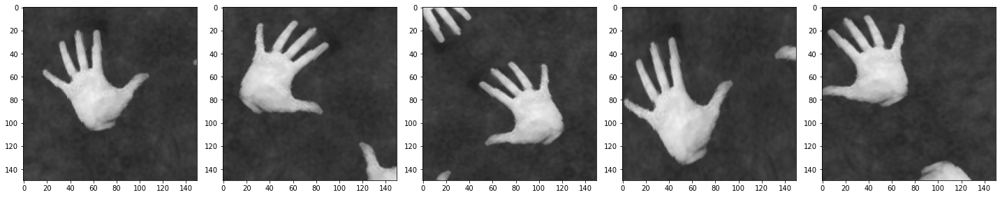

In [8]:
images = [training_data[0][0][0] for i in range(31)]
plotImages(images)

In [9]:
model_path = r'D:\finger 2\fingers\gesture_model\my_model.h5'
checkpoint = ModelCheckpoint(model_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]
 

In [10]:
#Building cnn model
cnn_model = keras.models.Sequential([
                                    keras.layers.Conv2D(filters=32, kernel_size=3, input_shape=[150, 150, 3]),
                                    keras.layers.MaxPooling2D(pool_size=(2,2)),
                                    keras.layers.Conv2D(filters=64, kernel_size=3),
                                    keras.layers.MaxPooling2D(pool_size=(2,2)),
                                    keras.layers.Conv2D(filters=128, kernel_size=3),
                                    keras.layers.MaxPooling2D(pool_size=(2,2)),                                    
                                    keras.layers.Conv2D(filters=256, kernel_size=3),
                                    keras.layers.MaxPooling2D(pool_size=(2,2)),
 
                                    keras.layers.Dropout(0.5),                                                                        
                                    keras.layers.Flatten(), # neural network beulding
                                    keras.layers.Dense(units=128, activation='relu'), # input layers
                                    keras.layers.Dropout(0.1),                                    
                                    keras.layers.Dense(units=256, activation='relu'),                                    
                                    keras.layers.Dropout(0.25),                                    
                                    keras.layers.Dense(units=6, activation='softmax') # output layer
])

In [11]:
# compile cnn model
cnn_model.compile(optimizer = Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
 

In [12]:
cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

In [13]:
# train cnn model
history = cnn_model.fit(training_data, 
                          epochs=50, 
                          verbose=1,
                          batch_size=64, 
                          validation_data= valid_data,
                          callbacks=callbacks_list) # time start 16.06

Epoch 1/50
158/158 [==============================] - ETA: 0s - loss: 1.6018 - accuracy: 0.3050
Epoch 1: val_accuracy improved from -inf to 0.63333, saving model to D:\finger 2\fingers\gesture_model\my_model.h5
158/158 [==============================] - 322s 2s/step - loss: 1.6018 - accuracy: 0.3050 - val_loss: 0.9652 - val_accuracy: 0.6333
Epoch 2/50
158/158 [==============================] - ETA: 0s - loss: 1.0413 - accuracy: 0.5524
Epoch 2: val_accuracy improved from 0.63333 to 0.81694, saving model to D:\finger 2\fingers\gesture_model\my_model.h5
158/158 [==============================] - 260s 2s/step - loss: 1.0413 - accuracy: 0.5524 - val_loss: 0.5179 - val_accuracy: 0.8169
Epoch 3/50
158/158 [==============================] - ETA: 0s - loss: 0.7739 - accuracy: 0.6696
Epoch 3: val_accuracy improved from 0.81694 to 0.88361, saving model to D:\finger 2\fingers\gesture_model\my_model.h5
158/158 [==============================] - 246s 2s/step - loss: 0.7739 - accuracy: 0.6696 - val_l

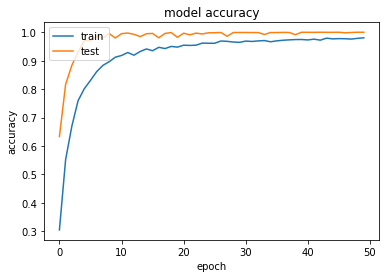

In [14]:
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.savefig(r'D:\finger 2\fingers\gesture_model\trainingaccuracy.png')
plt.show()

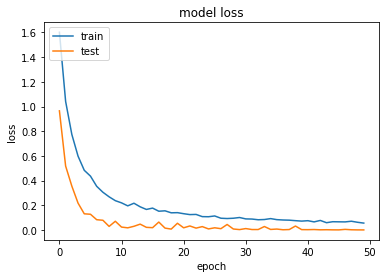

In [15]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.savefig(r'D:\finger 2\fingers\gesture_model\trainingloss.png')
plt.show()

In [16]:
history.history

{'loss': [1.6017951965332031,
  1.0412847995758057,
  0.7738566398620605,
  0.5980807542800903,
  0.48359742760658264,
  0.4363429546356201,
  0.3539581596851349,
  0.30585551261901855,
  0.2687959671020508,
  0.2376365214586258,
  0.2198048233985901,
  0.1955823004245758,
  0.21685002744197845,
  0.18787679076194763,
  0.1666051149368286,
  0.17741122841835022,
  0.1521291732788086,
  0.15541476011276245,
  0.13924016058444977,
  0.14052896201610565,
  0.13207897543907166,
  0.12480788677930832,
  0.12618190050125122,
  0.1083449125289917,
  0.10743999481201172,
  0.11372676491737366,
  0.09532774984836578,
  0.09289385378360748,
  0.09528038650751114,
  0.10118842869997025,
  0.08988910168409348,
  0.0887204110622406,
  0.08299216628074646,
  0.08490167558193207,
  0.09236833453178406,
  0.08391784131526947,
  0.08105137199163437,
  0.07966212928295135,
  0.07559628784656525,
  0.07201289385557175,
  0.07537142187356949,
  0.06570739299058914,
  0.07739897817373276,
  0.0591368563473

In [17]:
cnn_model.save(r'D:\finger 2\fingers\gesture_model\my_model.h5')

In [17]:
# this works
import cv2
import numpy as np
from keras.models import load_model

# Load the trained model
cnn_model = load_model('D:/finger 2/fingers/gesture_model/my_model.h5')

# Define the function to preprocess the image before feeding it to the model
def preprocess_image(img):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    img_resized = cv2.resize(img_rgb, (150, 150))
    img_normalized = img_resized.astype('float32') / 255.0
    img_expanded = np.expand_dims(img_normalized, axis=0)
    return img_expanded

# Define the function to predict the floor number based on the image
def predict_floor_number(img):
    img = preprocess_image(img)
    pred = cnn_model.predict(img)
    floor_number = np.argmax(pred)
    return floor_number

# Initialize the background subtractor
bg_subtractor = cv2.createBackgroundSubtractorMOG2()

# Initialize the camera capture
cap = cv2.VideoCapture(0)

# Define the font and text position for displaying the floor number
font = cv2.FONT_HERSHEY_SIMPLEX
text_position = (50, 50)
font_scale = 1
font_color = (255, 255, 255)  # White color

while True:
    # Capture an image from the camera
    ret, frame = cap.read()

    # Apply background subtraction to obtain the foreground mask
    fg_mask = bg_subtractor.apply(frame)

    # Threshold the foreground mask to create a binary image
    _, binary_mask = cv2.threshold(fg_mask, 128, 255, cv2.THRESH_BINARY)

    # Apply morphological operations to remove noise and refine the mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)

    # Bitwise AND the original frame with the binary mask to keep only the hand region
    hand_image = cv2.bitwise_and(frame, frame, mask=binary_mask)

    # Predict the floor number based on the hand image
    floor_number = predict_floor_number(hand_image)

    # Display the floor number on the camera frame
    cv2.putText(frame, f"Floor number: {floor_number}", text_position, font, font_scale, font_color, 2)

    # Display the frame
    cv2.imshow('Camera', frame)

    # Break the loop when 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the camera capture and close all windows
cap.release()
cv2.destroyAllWindows()


1/1 [==============================] - 0s 29ms/step


In [1]:
import cv2
import numpy as np
net = cv2.dnn.readNet("C:\\Users\\TEJAS\\Downloads\\Hand-Gestures-Recognition-master\\Hand-Gestures-Recognition-master\\Yolo\\yolov3_custom_last.weights", "C:\\Users\\TEJAS\\Downloads\\Hand-Gestures-Recognition-master\\Hand-Gestures-Recognition-master\\Yolo\\yolov3_custom.cfg") 
classes = list()
f= open("C:\\Users\\TEJAS\\Downloads\\Hand-Gestures-Recognition-master\\Hand-Gestures-Recognition-master\\Yolo\\obj.names", "r") # read .names file
for line in f.readlines(): # loop each line in file
    classes.append(line.strip())  # split removes extra spaces and append the rest data into the list
layer_names = net.getLayerNames() # get layes names
layer=list() # init layes list
for i in net.getUnconnectedOutLayers():
    # we are getting the output layer to get detection of the object
    layer.append(layer_names[i - 1])
colors = np.random.uniform(0, 255, size=(len(classes), 3))
#provide video path in string or 0== internal webcam 2== external webcam
cap = cv2.VideoCapture(0) # read input from default. 0 is for webcam 1 is for video and 2 is for exteral webcam 
if (cap.isOpened()== False): 
    print("Error opening video stream or file")
while(cap.isOpened()):
    # get video Frame by Frame
    ret, frame = cap.read()
    if ret == True:
        img=frame#set img to frame.
        height, width,_ = img.shape #this will get image height and width 
        # create input blob to detect image
        #0.00392 is the scale factor
        #416,416 is the size we are passing to the algorithm
        # it basically prepares the input image to run through the deep neural network.
        #openCV works with BGR format  
        #so blob has 3 channels BGR 
        #416 * 416 image
        blobObject = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False) 
        net.setInput(blobObject) 
        outputs = net.forward(layer)#get next layer
        #this basically helps us to extract the bounding box 
        class_ids = list() #helps detect class label 
        confidences = list() #assurity level of what an object is lower the value means that the system couldn't detect it 0.5 is threshold value 
        boxes = list() #bounding box 
        #displaying information on the screen 
        for out in outputs:
            for detection in out: 
                scores = detection[5:]  #detection[5:] returns probability of each score 
                class_id = np.argmax(scores) #class id is associated with class list name which tells about the object
                confidence = scores[class_id] 
                if confidence > 0.5: #tresh >0.5 it goes from 0 to 1
                   #object detected
                   #get center 
                   #when object will be detected it will mark a O on it 
                    center_x = int(detection[0] * width) #returns center x 
                    center_y = int(detection[1] * height) #return center y
                    #get height and width 
                    w = int(detection[2] * width) #2 gives wudth
                    h = int(detection[3] * height) #3 returns height 
                    # get points for rectangle
                    x = int(center_x - w / 2) #top left x
                    y = int(center_y - h / 2) #top left y 
                    #combine makes top left object
                    boxes.append([x, y, w, h])
                    confidences.append(float(confidence))
                    class_ids.append(class_id)
        dec = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)#number of dectected objects in frame
        for i in range(len(boxes)):
            if i in dec:
                x, y, w, h = boxes[i]
                label = str(classes[class_ids[i]])#get label
                color = colors[i]#each classs has specific color defined above
                cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)#create rectangle
                cv2.putText(img, label, (10,50), cv2.FONT_ITALIC, 2, color, 3)
        cv2.imshow("HAND GESTURE", img)
        if cv2.waitKey(25) & 0xFF == ord('q'):
            break
    else:
        break
cap.release()
cv2.destroyAllWindows()

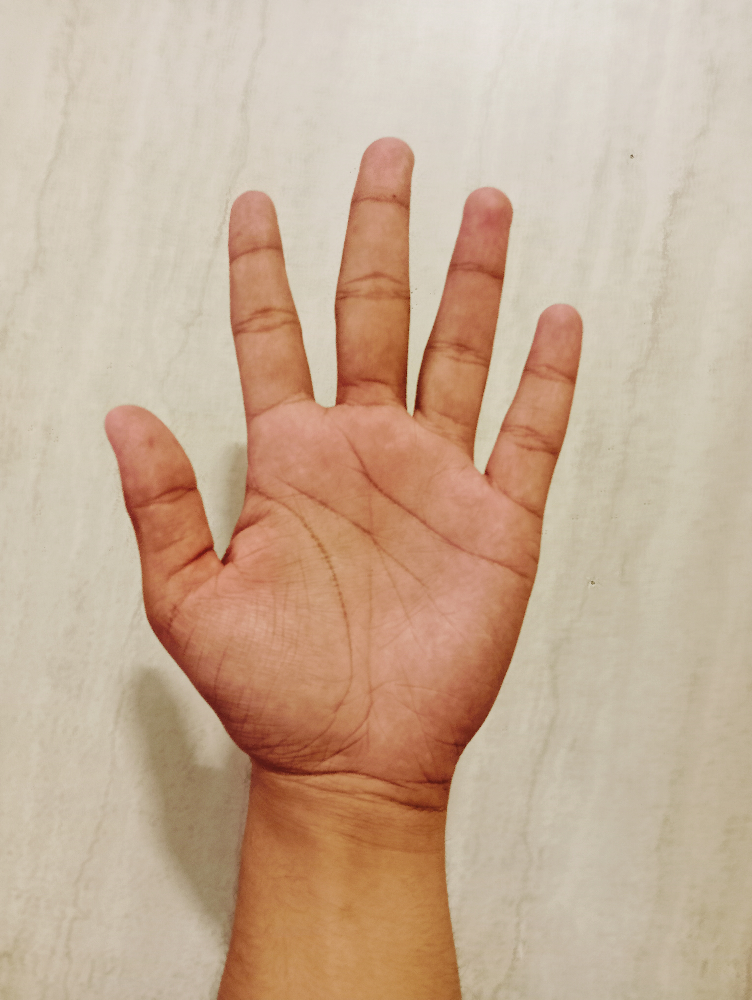

1/1 [==============================] - 1s 832ms/step
Floor number: 5


In [1]:
import cv2
import numpy as np
from keras.models import load_model
from IPython.display import display, Image

# Load the trained model
cnn_model = load_model('D:/finger 2/fingers/gesture_model/my_model.h5')

# Define the function to preprocess the image before feeding it to the model
def preprocess_image(img):
    img = cv2.resize(img, (150, 150))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.reshape(1, 150, 150, 3)
    img = img.astype('float32')
    img /= 255
    return img

# Define the function to predict the floor number based on the image
def predict_floor_number(img):
    img = preprocess_image(img)
    pred = cnn_model.predict(img)
    floor_number = np.argmax(pred)
    return floor_number

# Open the image file
img = cv2.imread('D:/finger 2/fingers/gesture_model/sid5.png')

# Display the image
display(Image(filename='D:/finger 2/fingers/gesture_model/sid5.png'))

# Predict the floor number based on the image
floor_number = predict_floor_number(img)
print('Floor number:', floor_number)


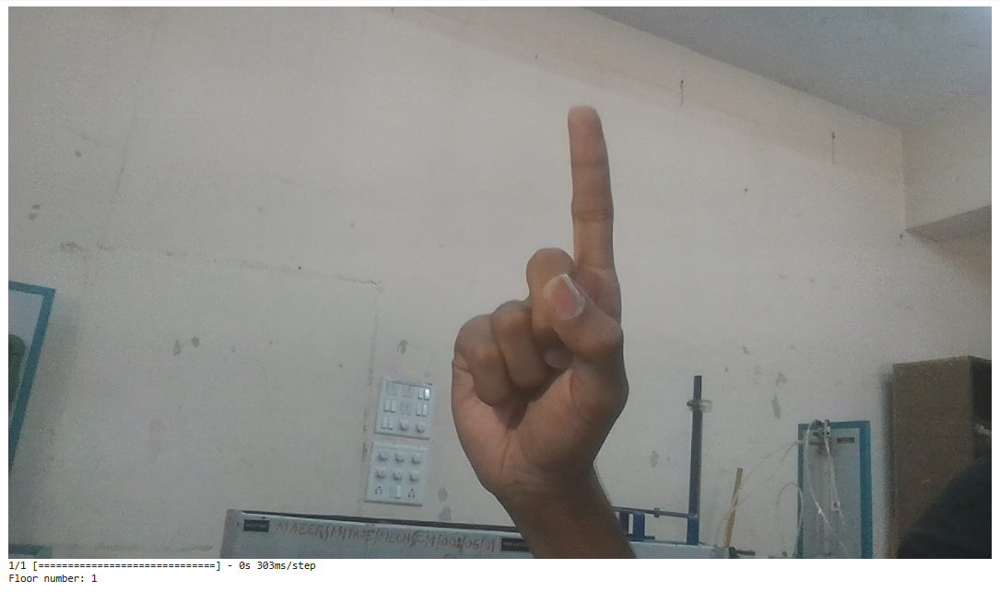

In [1]:
import cv2
import numpy as np
from keras.models import load_model
from IPython.display import display, Image

# Load the trained model
cnn_model = load_model('D:/finger 2/fingers/gesture_model/my_model.h5')

# Define the function to preprocess the image before feeding it to the model
def preprocess_image(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, (128, 128))
    img = img.reshape(1, 128, 128, 1)
    img = img.astype('float32')
    img /= 255
    return img

# Define the function to predict the floor number based on the image
def predict_floor_number(img):
    img = preprocess_image(img)
    pred = cnn_model.predict(img)
    floor_number = np.argmax(pred)
    return floor_number

# Open the image file
img = cv2.imread('D:/finger 2/fingers/gesture_model/1.png')

# Display the image
display(Image(filename='D:/finger 2/fingers/gesture_model/1.png'))

# # Predict the floor number based on the image
# floor_number = predict_floor_number(img)
# print('Floor number:', floor_number)


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model

# Load the trained model
cnn_model = load_model('D:/finger 2/fingers/gesture_model/my_model.h5')

# Define the function to preprocess the image before feeding it to the model
def preprocess_image(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, (150, 150))
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)  # Convert to 3-channel image
    img = img.reshape(1, 150, 150, 3)
    img = img.astype('float32')
    img /= 255
    return img

# Define the function to predict the floor number based on the image
def predict_floor_number(img):
    img = preprocess_image(img)
    pred = cnn_model.predict(img)
    floor_number = np.argmax(pred)
    return floor_number

# Open the image file
img = cv2.imread('D:/finger 2/fingers/gesture_model/1.png')

# Preprocess the image and apply Gaussian blur
processed_img = preprocess_image(img)
blur_img = cv2.GaussianBlur(processed_img.reshape(150, 150), (5, 5), 0)

# Apply thresholding on the blurred image
_, thresholded_img = cv2.threshold(blur_img, 127, 255, cv2.THRESH_BINARY)

# Display the images side by side
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

# Original image
axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0].set_title('Original Image')

# Gaussian blur image
axs[1].imshow(blur_img, cmap='gray', vmin=0, vmax=255)
axs[1].set_title('Gaussian Blur Image')

# Thresholded image
axs[2].imshow(thresholded_img, cmap='gray', vmin=0, vmax=255)
axs[2].set_title('Thresholded Image')

# Remove the axis labels
for ax in axs:
    ax.axis('off')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Predict the floor number based on the image
floor_number = predict_floor_number(img)
print('Floor number:', floor_number)



ValueError: cannot reshape array of size 67500 into shape (150,150)

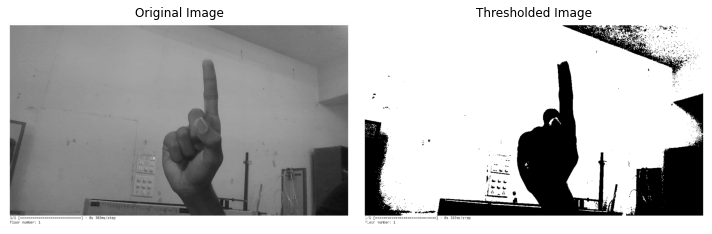

1/1 [==============================] - 0s 31ms/step

Floor number: 0


In [12]:
import cv2
import matplotlib.pyplot as plt

# Load the input image
image = cv2.imread('D:/finger 2/fingers/gesture_model/1.png', 0)

# Apply thresholding to the image
_, thresholded_img = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# Display the original and thresholded images side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Original image
axs[0].imshow(image, cmap='gray')
axs[0].set_title('Original Image')

# Thresholded image
axs[1].imshow(thresholded_img, cmap='gray')
axs[1].set_title('Thresholded Image')

# Remove the axis labels
for ax in axs:
    ax.axis('off')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Predict the floor number based on the image
floor_number = predict_floor_number(img)
print('\nFloor number:', '\033[1m' + str(floor_number) + '\033[0m')


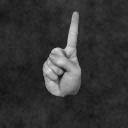

In [4]:
import cv2
import numpy as np
from keras.models import load_model
from IPython.display import display, Image

# Load the trained model
cnn_model = load_model('D:/finger 2/fingers/gesture_model/my_model.h5')

# Define the function to preprocess the image before feeding it to the model
def preprocess_image(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, (128, 128))
    img = img.reshape(1, 128, 128, 1)
    img = img.astype('float32')
    img /= 255
    return img

# Define the function to predict the floor number based on the image
def predict_floor_number(img):
    img = preprocess_image(img)
    pred = cnn_model.predict(img)
    floor_number = np.argmax(pred)
    return floor_number

# Open the image file
img = cv2.imread('D:/finger 2/fingers/gesture_model/test1.png')

# Display the image
display(Image(filename='D:/finger 2/fingers/gesture_model/test1.png'))

# # Predict the floor number based on the image
# floor_number = predict_floor_number(img)
# print('Floor number:', floor_number)


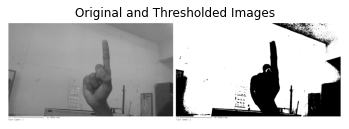

In [21]:
import cv2
import matplotlib.pyplot as plt

# Load the input image
image = cv2.imread('D:/finger 2/fingers/gesture_model/1.png',0)

# Apply thresholding to the image
_, thresholded_img = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# Concatenate the original and thresholded images horizontally
concatenated_img = cv2.hconcat([image, thresholded_img])

# Display the concatenated image
plt.imshow(concatenated_img, cmap='gray')
plt.axis('off')
plt.title('Original and Thresholded Images')

# Save the concatenated image
cv2.imwrite('D:/finger 2/fingers/gesture_model/concatenated_image.png', concatenated_img)

# Show the plot
plt.show()


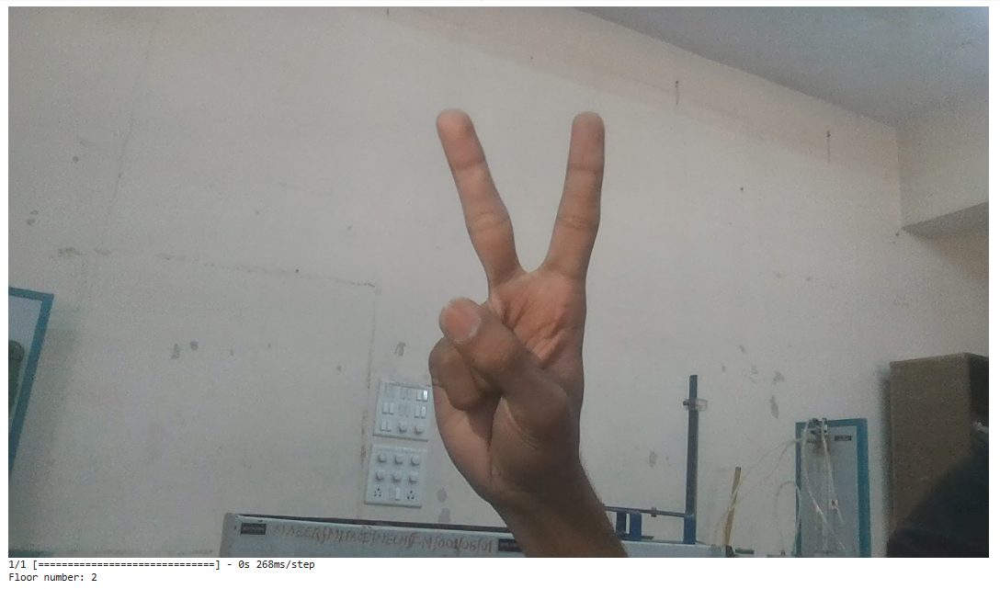

In [1]:
import cv2
import numpy as np
from keras.models import load_model
from IPython.display import display, Image

# Load the trained model
cnn_model = load_model('D:/finger 2/fingers/gesture_model/my_model.h5')

# Define the function to preprocess the image before feeding it to the model
def preprocess_image(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, (128, 128))
    img = img.reshape(1, 128, 128, 1)
    img = img.astype('float32')
    img /= 255
    return img

# Define the function to predict the floor number based on the image
def predict_floor_number(img):
    img = preprocess_image(img)
    pred = cnn_model.predict(img)
    floor_number = np.argmax(pred)
    return floor_number

# Open the image file
img = cv2.imread('D:/finger 2/fingers/gesture_model/2.png')

# Display the image
display(Image(filename='D:/finger 2/fingers/gesture_model/2.png'))

# Predict the floor number based on the image
# floor_number = predict_floor_number(img)
# print('Floor number:', floor_number)


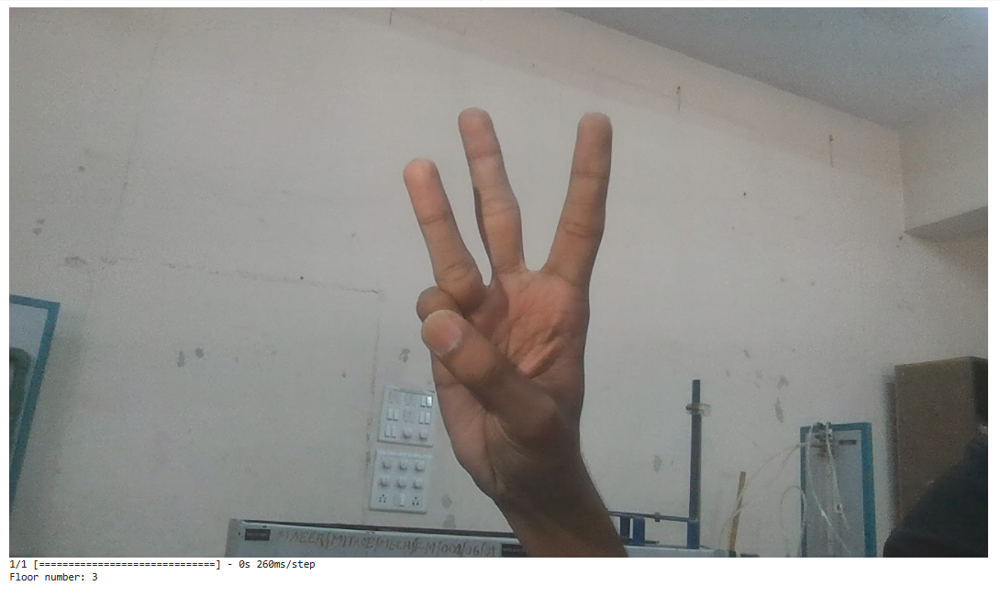

In [4]:
import cv2
import numpy as np
from keras.models import load_model
from IPython.display import display, Image

# Load the trained model
cnn_model = load_model('D:/finger 2/fingers/gesture_model/my_model.h5')

# Define the function to preprocess the image before feeding it to the model
def preprocess_image(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, (128, 128))
    img = img.reshape(1, 128, 128, 1)
    img = img.astype('float32')
    img /= 255
    return img

# Define the function to predict the floor number based on the image
def predict_floor_number(img):
    img = preprocess_image(img)
    pred = cnn_model.predict(img)
    floor_number = np.argmax(pred)
    return floor_number

# Open the image file
img = cv2.imread('D:/finger 2/fingers/gesture_model/3.png')

# Display the image
display(Image(filename='D:/finger 2/fingers/gesture_model/3.png'))

# Predict the floor number based on the image
# floor_number = predict_floor_number(img)
# print('Floor number:', floor_number)


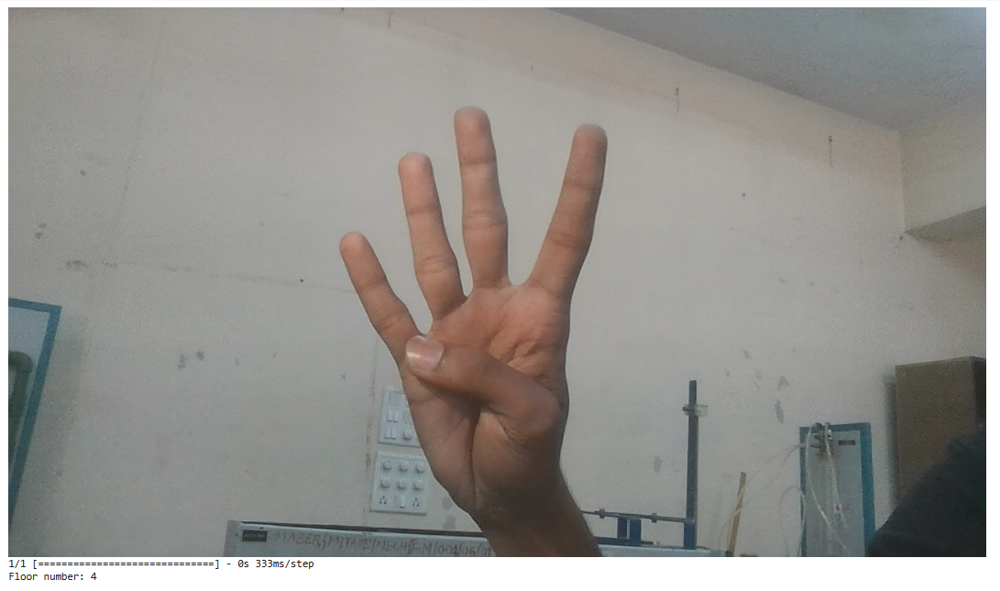

In [8]:
import cv2
import numpy as np
from keras.models import load_model
from IPython.display import display, Image

# Load the trained model
cnn_model = load_model('D:/finger 2/fingers/gesture_model/my_model.h5')

# Define the function to preprocess the image before feeding it to the model
def preprocess_image(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, (128, 128))
    img = img.reshape(1, 128, 128, 1)
    img = img.astype('float32')
    img /= 255
    return img

# Define the function to predict the floor number based on the image
def predict_floor_number(img):
    img = preprocess_image(img)
    pred = cnn_model.predict(img)
    floor_number = np.argmax(pred)
    return floor_number

# Open the image file
img = cv2.imread('D:/finger 2/fingers/mymodel/4.png')

# Display the image
display(Image(filename='D:/finger 2/fingers/mymodel/4.png'))

# # Predict the floor number based on the image
# floor_number = predict_floor_number(img)
# print('Floor number:', floor_number)


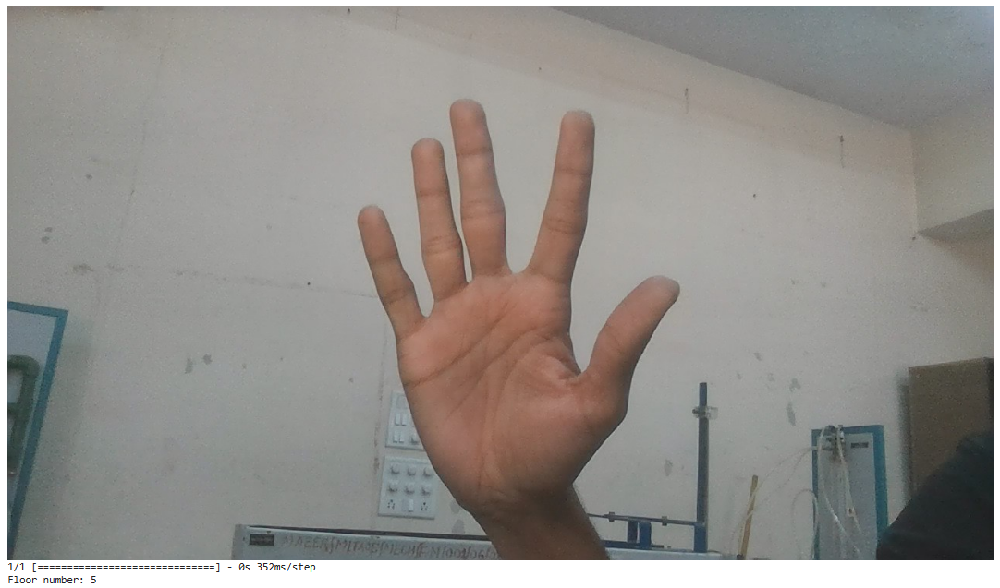

In [9]:
import cv2
import numpy as np
from keras.models import load_model
from IPython.display import display, Image

# Load the trained model
cnn_model = load_model('D:/finger 2/fingers/gesture_model/my_model.h5')

# Define the function to preprocess the image before feeding it to the model
def preprocess_image(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, (128, 128))
    img = img.reshape(1, 128, 128, 1)
    img = img.astype('float32')
    img /= 255
    return img

# Define the function to predict the floor number based on the image
def predict_floor_number(img):
    img = preprocess_image(img)
    pred = cnn_model.predict(img)
    floor_number = np.argmax(pred)
    return floor_number

# Open the image file
img = cv2.imread('D:/finger 2/fingers/mymodel/5.png')

# Display the image
display(Image(filename='D:/finger 2/fingers/mymodel/5.png'))

# # Predict the floor number based on the image
# floor_number = predict_floor_number(img)
# print('Floor number:', floor_number)


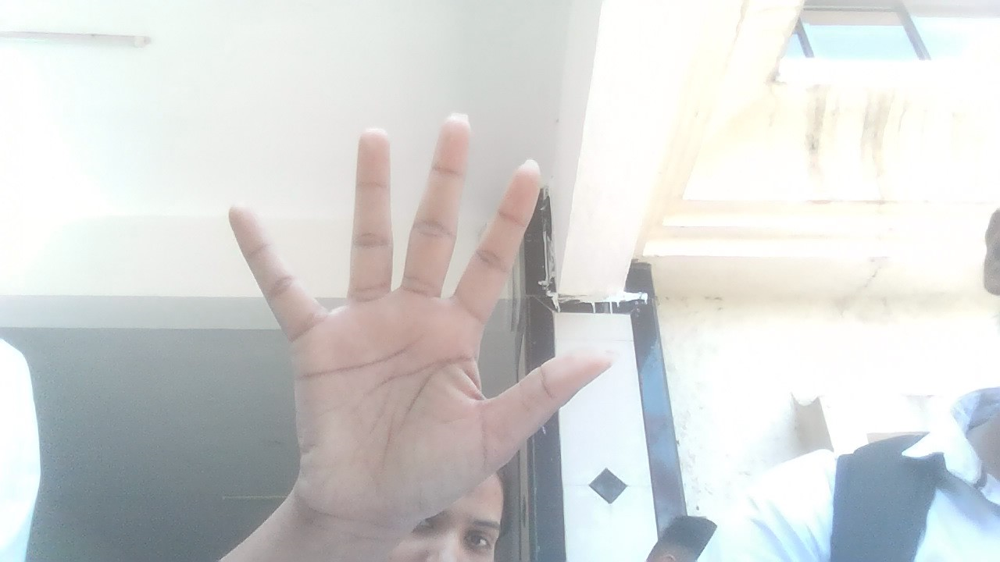

1/1 [==============================] - 0s 260ms/step
Floor number: 3


In [12]:
import cv2
import numpy as np
from keras.models import load_model
from IPython.display import display, Image

# Load the trained model
cnn_model = load_model('D:/finger 2/fingers/gesture_model/my_model.h5')

# Define the function to preprocess the image before feeding it to the model
def preprocess_image(img):
    img = cv2.resize(img, (150, 150))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.reshape(1, 150, 150, 3)
    img = img.astype('float32')
    img /= 255
    return img

# Define the function to predict the floor number based on the image
def predict_floor_number(img):
    img = preprocess_image(img)
    pred = cnn_model.predict(img)
    floor_number = np.argmax(pred)
    return floor_number

# Open the image file
img = cv2.imread('D:/finger 2/fingers/gesture_model/demo1.png')

# Display the image
display(Image(filename='D:/finger 2/fingers/gesture_model/demo1.png'))

# Predict the floor number based on the image
floor_number = predict_floor_number(img)
print('Floor number:', floor_number)
